In [1]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
import re
import os
import glob

In [2]:
# define the base path for the datasets
base_path = 'drugs reac age group/semaglutide'

# define the file pattern to match the datasets
file_pattern = os.path.join(base_path, 'semaglutide_reac_demo_*.csv')

# get the list of file paths sorted by year
file_paths = sorted(glob.glob(file_pattern), key=lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0]))

# load the datasets into a list of dataframes
datasets = [pd.read_csv(file_path) for file_path in file_paths]

print(f"Loaded {len(datasets)} datasets")
print(f"First dataset sample: \n{datasets[0].head()}")

Loaded 11 datasets
First dataset sample: 
Empty DataFrame
Columns: [primaryid, caseid, drug_seq, role_cod, drugname, val_vbm, route, dose_vbm, cum_dose_chr, cum_dose_unit, dechal, rechal, lot_num, exp_dt, nda_num, dose_amt, dose_unit, dose_form, dose_freq, year_x, quarter_x, pt, year_y, quarter_y, caseversion, i_f_code, event_dt, mfr_dt, init_fda_dt, fda_dt, rept_cod, mfr_num, mfr_sndr, age, age_cod, gndr_cod, e_sub, wt, wt_cod, rept_dt, to_mfr, occp_cod, reporter_country, occr_country, year, quarter, age_group]
Index: []

[0 rows x 47 columns]


In [3]:
combined_df = pd.concat(datasets)

/var/folders/ld/dl450hd568j5wxpfd5d84y340000gn/T/ipykernel_18028/2609166978.py:1: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  combined_df = pd.concat(datasets)


In [4]:
stop_words = set(stopwords.words('english'))

# Preprocessing function for text data
def preprocess_text(text):
    if not isinstance(text, str):  # If the input is not a string, replace with an empty string or 'unknown'
        return ''
    # Convert text to lowercase
    text = text.lower()
    # Remove non-alphabetic characters
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    # Remove stopwords
    text = ' '.join([word for word in text.split() if word not in stop_words])
    return text


In [5]:
combined_df['preprocessed_pt'] = combined_df['pt'].apply(preprocess_text)
combined_df.dropna(subset=['pt'], inplace=True)

print(f"Preprocessed reactions sample:\n{combined_df['preprocessed_pt'].head()}")

Preprocessed reactions sample:
0              amnesia
1    confusional state
2        cholecystitis
3        cholecystitis
4            gastritis
Name: preprocessed_pt, dtype: object


In [6]:
reaction_texts = combined_df['preprocessed_pt'].tolist()

In [7]:
from bertopic import BERTopic

semaglutide_topic_model = BERTopic()
topics, probs = semaglutide_topic_model.fit_transform(reaction_texts)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitl

In [8]:
semaglutide_topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,401,-1_exposure_pregnancy_maternal_restless,"[exposure, pregnancy, maternal, restless, legs...","[maternal exposure pregnancy, maternal exposur..."
1,0,425,0_nausea___,"[nausea, , , , , , , , , ]","[nausea, nausea, nausea]"
2,1,407,1_vomiting_projectile__,"[vomiting, projectile, , , , , , , , ]","[vomiting, vomiting, vomiting]"
3,2,379,2_dyspnoea_rest_pyuria_papule,"[dyspnoea, rest, pyuria, papule, hepatosplenom...","[dyspnoea, dyspnoea, dyspnoea]"
4,3,371,3_weight_decreased_poor_loss,"[weight, decreased, poor, loss, , , , , , ]","[weight decreased, weight decreased, weight de..."
...,...,...,...,...,...
403,402,11,402_cataract_nuclear__,"[cataract, nuclear, , , , , , , , ]","[cataract, cataract, cataract]"
404,403,11,403_arthropathy_psoriatic__,"[arthropathy, psoriatic, , , , , , , , ]","[psoriatic arthropathy, psoriatic arthropathy,..."
405,404,11,404_mobility_motion_range_activity,"[mobility, motion, range, activity, decreased,...","[mobility decreased, mobility decreased, mobil..."
406,405,11,405_breast_cancer_mass_recurrent,"[breast, cancer, mass, recurrent, skin, , , , , ]","[breast cancer, breast cancer, breast cancer]"


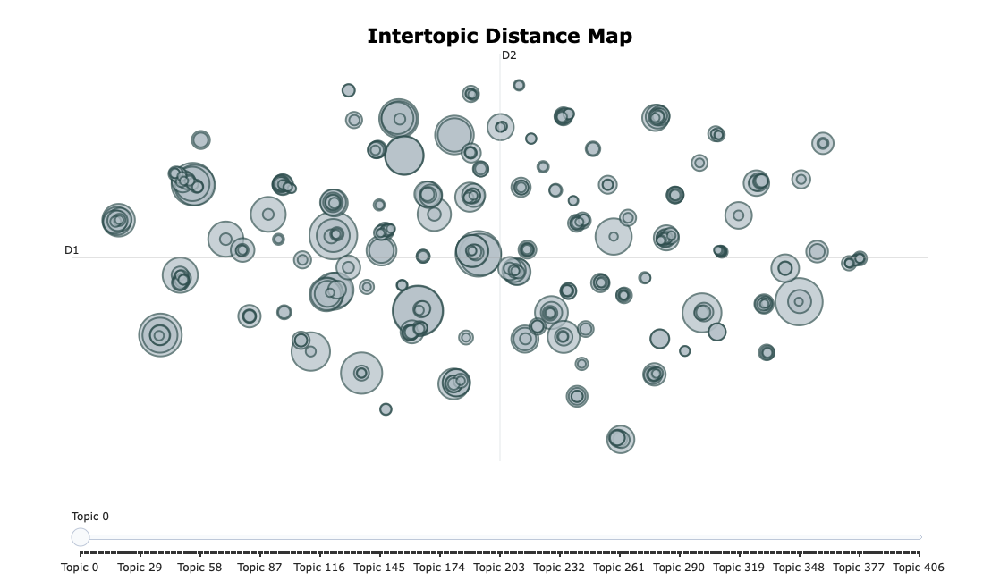

In [9]:
semaglutide_topic_model.visualize_topics()

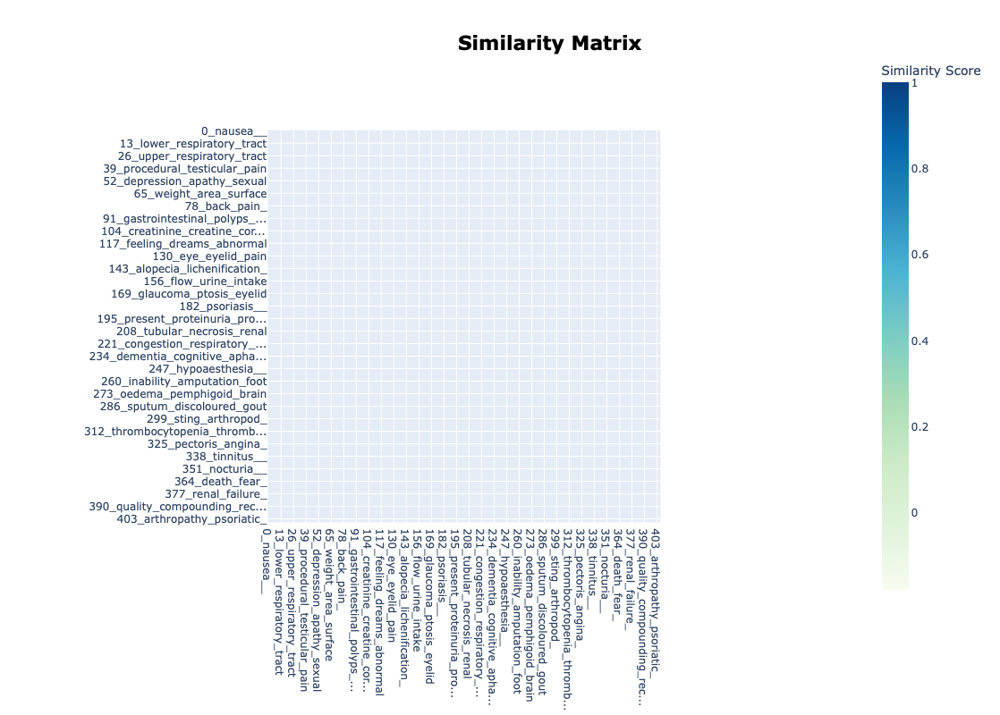

In [10]:
semaglutide_topic_model.visualize_heatmap()